<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/5/58/Uber_logo_2018.svg/1024px-Uber_logo_2018.svg.png" alt="UBER LOGO" width="50%" />

# UBER Pickups

## Company's Description 📇

<a href="http://uber.com/" target="_blank">Uber</a> is one of the most famous startup in the world. It started as a ride-sharing application for people who couldn't afford a taxi. Now, Uber expanded its activities to Food Delivery with <a href="https://www.ubereats.com/fr-en" target="_blank">Uber Eats</a>, package delivery, freight transportation and even urban transportation with <a href="https://www.uber.com/fr/en/ride/uber-bike/" target="_blank"> Jump Bike</a> and <a href="https://www.li.me/" target="_blank"> Lime </a> that the company funded.


The company's goal is to revolutionize transportation accross the globe. It operates now on about 70 countries and 900 cities and generates over $14 billion revenue! 😮


## Project 🚧

One of the main pain point that Uber's team found is that sometimes drivers are not around when users need them. For example, a user might be in San Francisco's Financial District whereas Uber drivers are looking for customers in Castro.  

(If you are not familiar with the bay area, check out <a href="https://www.google.com/maps/place/San+Francisco,+CA,+USA/@37.7515389,-122.4567213,13.43z/data=!4m5!3m4!1s0x80859a6d00690021:0x4a501367f076adff!8m2!3d37.7749295!4d-122.4194155" target="_blank">Google Maps</a>)

Eventhough both neighborhood are not that far away, users would still have to wait 10 to 15 minutes before being picked-up, which is too long. Uber's research shows that users accept to wait 5-7 minutes, otherwise they would cancel their ride.

Therefore, Uber's data team would like to work on a project where **their app would recommend hot-zones in major cities to be in at any given time of day.**  

## Goals 🎯

Uber already has data about pickups in major cities. Your objective is to create algorithms that will determine where are the hot-zones that drivers should be in. Therefore you will:

* Create an algorithm to find hot zones
* Visualize results on a nice dashboard

## Scope of this project 🖼️

To start off, Uber wants to try this feature in New York city. Therefore you will only focus on this city. Data can be found here:

👉👉<a href="https://full-stack-bigdata-datasets.s3.eu-west-3.amazonaws.com/Machine+Learning+non+Supervis%C3%A9/Projects/uber-trip-data.zip" target="_blank"> Uber Trip Data</a> 👈👈

**You only need to focus on New York City for this project**

In [2]:
import pandas as pd
import numpy as np
import dask.dataframe as dd

import zipfile
import os
import glob

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score

import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
# Load data
trip_data = pd.read_csv('/content/drive/MyDrive/_JEDHA_DATASCIENCE/UNSUPERVISED_ML/project_uber/uber-trip-data/trip_data_cleaned.csv')

In [11]:
trip_data.head()

,Lat,Lon,Base,hour,day,weekday,month,LocationID,Borough,Zone
0,40.7366,-73.9906,B02512,0,1,Friday,8,192,Queens,Queensboro Hill
1,40.7260,-73.9918,B02512,0,1,Friday,8,192,Queens,Queensboro Hill
2,40.7209,-74.0507,B02512,0,1,Friday,8,192,Queens,Queensboro Hill
3,40.7387,-73.9856,B02512,0,1,Friday,8,192,Queens,Queensboro Hill
4,40.7323,-74.0077,B02512,0,1,Friday,8,192,Queens,Queensboro Hill


In [42]:
trip_data['weekday'].unique()

array(['Friday', 'Saturday', 'Sunday', 'Monday', 'Tuesday', 'Wednesday',
       'Thursday'], dtype=object)

In [46]:
trip_data['Borough'].unique()

array(['Queens', 'Manhattan', 'Brooklyn'], dtype=object)

# Compare K-Means & DBSCAN algorithms for Clustering

###To start , let's pick one day at a given hour and check the hot-zones.

In [12]:
df_trip_data =trip_data.copy(deep=True)

In [14]:
# Sample
df_hotzone = df_trip_data.sample(2500000, random_state=42)

In [15]:
# Filter 'Monday' at '17'
df_hotzone = df_hotzone[(df_hotzone['weekday']=='Monday') & (df_hotzone['hour'] ==17)]

In [16]:
print(df_hotzone.head())
print(df_hotzone.size)

             Lat      Lon    Base  hour  day weekday  month  LocationID  \
4080003  40.7122 -74.0085  B02598    17   19  Monday      5         234   
2063597  40.7214 -73.9956  B02682    17   14  Monday      7          52   
60091    40.7502 -73.9949  B02598    17    4  Monday      8         234   
4443908  40.7640 -73.9756  B02682    17   19  Monday      5          52   
934600   40.7711 -73.8661  B02598    17   14  Monday      4         234   

           Borough         Zone  
4080003  Manhattan     Union Sq  
2063597   Brooklyn  Cobble Hill  
60091    Manhattan     Union Sq  
4443908   Brooklyn  Cobble Hill  
934600   Manhattan     Union Sq  
232110


In [17]:
# Visualization of hot-zones
fig = px.scatter_mapbox(df_hotzone,
                     lat='Lat',
                     lon ='Lon',
                     mapbox_style='open-street-map',
                     color ='weekday',
                     zoom = 10,
                     center = {'lat': 40.7128, 'lon': -74.0060},
                     )

fig.update_layout(
      title_text="Hotzones in New York on a Monday at 5pm",
      title_x=0.5,
      width =1100,
      height =700
      )

fig.show()

##Apply K-Means Clustering

In [18]:
from sklearn.cluster import KMeans
scaler = StandardScaler()

X = df_hotzone[['Lat', 'Lon']]

X = scaler.fit_transform(X)

**Let's use the Elbow method to find the best k**

In [19]:
wcss = []
k_range = range(1,11)

for k in k_range :
  kmeans = KMeans(n_clusters =k,random_state=42)
  kmeans.fit(X)
  wcss.append(kmeans.inertia_)
  print(f"WCSS for K={k} --> {wcss[-1]}")

WCSS for K=1 --> 46422.00000000001
WCSS for K=2 --> 31749.257724991792
WCSS for K=3 --> 21585.228820768676
WCSS for K=4 --> 16809.424646934753
WCSS for K=5 --> 14520.777270583712
WCSS for K=6 --> 12550.34978831513
WCSS for K=7 --> 11089.964942202887
WCSS for K=8 --> 8281.51711319284
WCSS for K=9 --> 7105.285035784136
WCSS for K=10 --> 6213.221671280578


**Visualize the elbow method results**

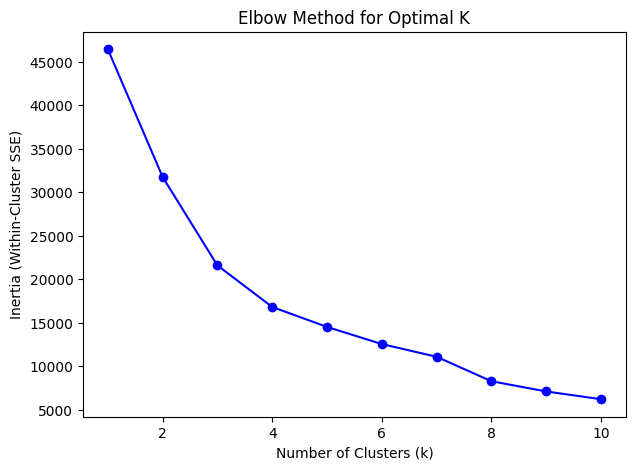

In [20]:
# Plot Elbow Method
plt.figure(figsize=(7,5))
plt.plot(k_range, wcss,'bo-', markersize=6)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia (Within-Cluster SSE)")
plt.title("Elbow Method for Optimal K")
plt.show()

Based on the results, the “elbow” point, where the rate of decrease in inertia slows down, is observed at k = 3.

**Let's apply K-means to our X**

In [21]:
kmeans = KMeans(n_clusters=3, random_state=42)
df_hotzone['kmeans_cluster'] = kmeans.fit_predict(X)

print(df_hotzone.loc[:,'kmeans_cluster'].value_counts())

kmeans_cluster
2    13830
0     8677
1      704
Name: count, dtype: int64


In [22]:
print(kmeans.cluster_centers_)

[[-0.72175088 -0.42521296]
 [-2.26695858  3.86163033]
 [ 0.57300098  0.0720423 ]]


In [23]:
# Visualization of K-means Cluster Centers
centroids = kmeans.cluster_centers_

# create scatter plot
fig_kmeans = px.scatter_map(df_hotzone,
                        lat='Lat',
                        lon ='Lon',
                        color ='kmeans_cluster',
                        center={"lat": 40.7128, "lon": -74.0060},
                        title="Kmeans Clusters - Hotzones in New York at 5 p.m. on Monday",
                        zoom =8,
                        )

fig_kmeans.update_layout(
    title_x=0.5,
    height=600,
    width=1000)
fig_kmeans.show()

Even after applying K-Means, there are points that are too far from their assigned centroid. This is as expected when using K-means. These points are our outliers. Low-density areas get clustered incorrectly.

##Apply DBSCAN Clustering

In [84]:
# Apply DBSCAN
dbscan = DBSCAN(eps=0.15, metric='manhattan', min_samples=100, n_jobs=-1)

df_hotzone['dbscan_cluster'] = dbscan.fit_predict(X)
print(df_hotzone['dbscan_cluster'].value_counts())

dbscan_cluster
 0    18818
-1     2571
 3      509
 1      459
 4      376
 2      311
 5      167
Name: count, dtype: int64


In [85]:
df_hotzone['Zone'].unique()

array(['Union Sq', 'Cobble Hill', 'Queensboro Hill',
       'West Chelsea/Hudson Yards', 'Garment District'], dtype=object)

In [86]:
# Visualization of DBSCAN
fig_dbscan = px.scatter_map(
    df_hotzone[df_hotzone['dbscan_cluster'] !=-1],
    lat ='Lat',
    lon ='Lon',
    color ='dbscan_cluster',
    map_style='open-street-map',
    center={'lat': 40.7128, 'lon': -74.0060},
    title='DBSCAN Clusters - Hotzones in New York at 5 p.m. on Monday',
    zoom =10
    )

fig_dbscan.update_layout(
    title_x=0.5,
    height=600,
    width=1000)
fig_dbscan.show()

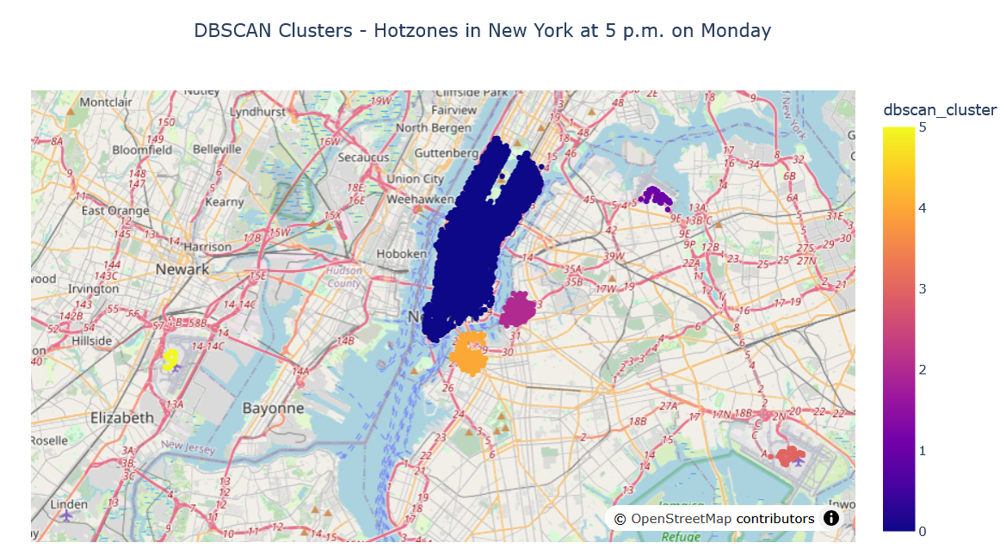

Our DBSCAN model has correctly identified Uber pickup hotzones on a friday at 5pm at the following locations:

- Cluster 0 : Manhattan : Midtown Manhattan
- Cluster 1 : Queens : JFK Airport
- Cluster 2 : Queens : LaGuardia Airport
- Cluster 3 : New Jersey (Outside NYC) : Newark Liberty Airport
- Cluster 4 : Brooklyn : Williamsburg
- Cluster 5 : Brooklyn : Downtown Brooklyn

These are known high-demand Uber pickup areas and the model has correctly separated key locations such as major transport hubs and NYC business districts.

In [116]:
db_nyc_trip_clusters = df_hotzone.copy()

In [129]:
db_nyc_trip_clusters.head()

,Lat,Lon,LocationID,Borough,Zone,dbscan_cluster
4080003,40.7122,-74.0085,234,Manhattan,Union Sq,0
2063597,40.7214,-73.9956,52,Brooklyn,Cobble Hill,0
60091,40.7502,-73.9949,234,Manhattan,Union Sq,0
4443908,40.7640,-73.9756,52,Brooklyn,Cobble Hill,0
934600,40.7711,-73.8661,234,Manhattan,Union Sq,1


In [118]:
db_nyc_trip_clusters = db_nyc_trip_clusters.drop(columns=['Base','hour','day','weekday','month','kmeans_cluster'], axis=1)

In [120]:
db_nyc_trip_clusters.head()

,Lat,Lon,LocationID,Borough,Zone,dbscan_cluster
4080003,40.7122,-74.0085,234,Manhattan,Union Sq,0
2063597,40.7214,-73.9956,52,Brooklyn,Cobble Hill,0
60091,40.7502,-73.9949,234,Manhattan,Union Sq,0
4443908,40.7640,-73.9756,52,Brooklyn,Cobble Hill,0
934600,40.7711,-73.8661,234,Manhattan,Union Sq,1


In [121]:
# Save cleaned file into csv
db_nyc_trip_clusters.to_csv('/content/drive/MyDrive/_JEDHA_DATASCIENCE/UNSUPERVISED_ML/project_uber/uber-trip-data/nyc_trips_clusters.csv',index=False)

# Now let's  find hot-zones per day of the week in New York using the clusters found by DBSCAN model.

**Let's load the file with clusters and copy the trip_data**

In [27]:
trip_data_df = trip_data.copy()

In [28]:
nyc_trip_clusters = pd.read_csv('/content/drive/MyDrive/_JEDHA_DATASCIENCE/UNSUPERVISED_ML/project_uber/uber-trip-data/nyc_trips_clusters.csv')

**Now let's used NN model and assign the neareast dbscan_cluster to each trip in the trip_data.**

In [29]:
from sklearn.neighbors import NearestNeighbors

def assign_clusters_to_trips(trip_data, nyc_clusters):
    """
    Assign the nearest dbscan_cluster from nyc_clusters to each trip in trip_data.

    Args:
        trip_data (pd.DataFrame): Trips dataset with 'Lat', 'Lon'.
        nyc_clusters (pd.DataFrame): NYC clusters dataset with 'Lat', 'Lon', 'dbscan_cluster'.

    Returns:
        trip_data (pd.DataFrame): Same trip data but with a new 'dbscan_cluster' column assigned.
    """
    # Prepare data
    trip_coords = trip_data[['Lat', 'Lon']].to_numpy()
    cluster_coords = nyc_clusters[['Lat', 'Lon']].to_numpy()

    # Fit Nearest Neighbors
    nn = NearestNeighbors(n_neighbors=1, metric='manhattan')  # Manhattan distance for NYC grid
    nn.fit(cluster_coords)

    # Find nearest cluster for each trip
    distances, indices = nn.kneighbors(trip_coords)

    # Map indices to dbscan_cluster
    trip_data['dbscan_cluster'] = nyc_clusters.iloc[indices.flatten()]['dbscan_cluster'].values

    return trip_data


In [30]:
trip_data_df = trip_data_df.dropna(subset=['Lat', 'Lon']).reset_index(drop=True)

In [31]:
trip_data_df2 = assign_clusters_to_trips(trip_data_df, nyc_trip_clusters)

# Now trip_data has a new 'dbscan_cluster'
print(trip_data_df2[['Lat', 'Lon', 'dbscan_cluster']].head())


       Lat      Lon  dbscan_cluster
0  40.7366 -73.9906               0
1  40.7260 -73.9918               0
2  40.7209 -74.0507              -1
3  40.7387 -73.9856               0
4  40.7323 -74.0077               0


In [33]:
trip_data_df2 = trip_data_df2[trip_data_df2['dbscan_cluster'].notnull()].reset_index(drop=True)

In [34]:
trip_data_df2.head()

,Lat,Lon,Base,hour,day,weekday,month,LocationID,Borough,Zone,dbscan_cluster
0,40.7366,-73.9906,B02512,0,1,Friday,8,192,Queens,Queensboro Hill,0
1,40.7260,-73.9918,B02512,0,1,Friday,8,192,Queens,Queensboro Hill,0
2,40.7209,-74.0507,B02512,0,1,Friday,8,192,Queens,Queensboro Hill,-1
3,40.7387,-73.9856,B02512,0,1,Friday,8,192,Queens,Queensboro Hill,0
4,40.7323,-74.0077,B02512,0,1,Friday,8,192,Queens,Queensboro Hill,0


In [43]:
def plot_hotzones_clusters(trip_data, weekday, hour):
    """
    Plots NYC hotzones based on assigned dbscan clusters for a given weekday and hour.

    Args:
        trip_data (pd.DataFrame): Dataset with 'Lat', 'Lon', 'weekday', 'hour', 'dbscan_cluster', 'Zone', 'Borough'.
        weekday (str): Name of the weekday to filter (e.g., 'Monday').
        hour (int): Hour of the day to filter (0-23).

    Returns:
        fig (plotly.graph_objs._figure.Figure): Interactive mapbox plot.
    """

    # Filter trips
    df_filtered = trip_data[
        (trip_data['weekday'] == weekday) &
        (trip_data['hour'] == hour) &
        (trip_data['dbscan_cluster'] != -1)  # Remove noise clusters
    ]

    if df_filtered.empty:
        print(f"No valid trips found for {weekday} at {hour}:00 (after removing noise).")
        return None

    # Plot
    fig = px.scatter_mapbox(
        df_filtered,
        lat='Lat',
        lon='Lon',
        color='dbscan_cluster',  # Color by clusters
        mapbox_style='open-street-map',
        center={"lat": 40.7128, "lon": -74.0060},
        zoom=10,
        hover_data=['Zone', 'Borough'],
        title=f"Hotzones in New York on {weekday} at {hour}:00"
    )

    fig.update_layout(
        title_x=0.5,
        height=600,
        width=1000,
        coloraxis_colorbar=dict(
            title="Cluster ID"
        )
    )

    return fig


In [48]:
fig = plot_hotzones_clusters(trip_data_df2, weekday='Monday', hour=17)
fig.show()


In [49]:
fig = plot_hotzones_clusters(trip_data_df2, weekday='Tuesday', hour=18)
fig.show()


In [50]:
fig = plot_hotzones_clusters(trip_data_df2, weekday='Wednesday', hour=19)
fig.show()


In [51]:
fig = plot_hotzones_clusters(trip_data_df2, weekday='Thursday', hour=7)
fig.show()


In [52]:
fig = plot_hotzones_clusters(trip_data_df2, weekday='Friday', hour=8)
fig.show()


In [53]:
fig = plot_hotzones_clusters(trip_data_df2, weekday='Saturday', hour=12)
fig.show()


In [54]:
fig = plot_hotzones_clusters(trip_data_df2, weekday='Sunday', hour=10)
fig.show()
